In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os, pickle
import sys
from skimage import io
import os

sys.path.append("../../")

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
from dataprocessing.dataloaders import ImageBlindSpotDataset

data_dir = '/nadeem_lab/Gunjan/data/impartial/Vectra_2CH/' ## This should be the file where the .npz data is
scribbles = '200'

pd_files = pd.read_csv(data_dir + 'files.csv', index_col=0)
print(pd_files)

files_scribbles = data_dir + 'files_2tasks1x2classes_3images_scribble_train_' + scribbles + '.csv'
pd_files_scribbles = pd.read_csv(files_scribbles)

print()
print('Total images  train: ', len(pd_files_scribbles),'; test: ', len(pd_files)-len(pd_files_scribbles) )
pd_files_scribbles

   prefix  input_file  group
0  image0  image0.npz   test
1  image1  image1.npz  train
2  image2  image2.npz   test
3  image3  image3.npz  train
4  image4  image4.npz   test
5  image5  image5.npz  train
6  image6  image6.npz   test
7  image7  image7.npz  train
8  image8  image8.npz   test
9  image9  image9.npz  train

Total images  train:  5 ; test:  5


,input_file,prefix,scribble_file,total_labels_class0,scribble_labels_class0,label_with_scribble_class0,perc_pixels_scribbles_TP_class0,perc_pixels_scribbles_TN_class0,total_labels_class1,scribble_labels_class1,label_with_scribble_class1,perc_pixels_scribbles_TP_class1,perc_pixels_scribbles_TN_class1,total_labels_class2,scribble_labels_class2,label_with_scribble_class2,perc_pixels_scribbles_TP_class2,perc_pixels_scribbles_TN_class2,gt_index_task0,gt_index_task1
0,image1.npz,image1,image1_2tasks1x2classes_3images_scribble_n200.npz,211,14,[ 79 83 88 94 95 96 106 107 108 182 183 1...,1.17,2.02,189,16,[ 85 86 88 94 135 137 140 141 145 151 159 1...,0.62,1.05,62,13,[25 26 27 29 31 32 33 35 36 41 60 61 62],2.14,0.34,[0],"[1, 2]"
1,image3.npz,image3,image3_2tasks1x2classes_3images_scribble_n200.npz,230,16,[ 73 82 85 156 158 176 178 179 185 191 194 2...,1.18,1.58,166,16,[ 25 28 37 38 52 88 89 91 93 96 97 1...,0.63,0.87,219,12,[ 7 10 18 25 40 189 192 194 196 197 200 201],0.63,0.34,[0],"[1, 2]"
2,image5.npz,image5,image5_2tasks1x2classes_3images_scribble_n200.npz,200,15,[ 3 11 13 128 135 138 152 157 158 169 174 1...,1.85,1.62,190,10,[ 39 43 52 54 57 99 106 107 112 113],0.34,0.48,73,9,[ 1 8 9 11 22 26 28 44 45],1.15,0.30,[0],"[1, 2]"
3,image7.npz,image7,image7_2tasks1x2classes_3images_scribble_n200.npz,187,20,[ 6 7 13 20 21 70 72 84 89 98 99 1...,1.83,2.39,171,15,[ 42 49 53 60 65 72 74 76 80 82 84 ...,0.27,0.92,78,12,[14 16 47 49 51 52 68 70 71 73 74 75],1.31,0.30,[0],"[1, 2]"
4,image9.npz,image9,image9_2tasks1x2classes_3images_scribble_n200.npz,128,16,[ 18 21 22 34 36 40 41 44 85 90 94 1...,1.90,11.48,144,15,[ 4 5 15 18 76 87 94 125 127 133 136 1...,0.28,1.53,5,5,[1 2 3 4 5],8.49,0.27,[0],"[1, 2]"


In [13]:
from general.utils import mkdir,load_json
basedir = '/nadeem_lab/Gunjan/experiments/Vectra_2CH/models_with_epoch/Vectra_2CH/s200/Impartial/'
model_name = 'Im_2tasks_base64depth4relu_adam5e4_mcdrop1e4_nsave5_segCEGauss_w04501_seed42'
pd_summary = pd.read_csv(basedir + model_name + '/pd_summary_results.csv')


from general.evaluation import summary_performance
pd_best = summary_performance(pd_summary, best_all = False, metric = 'AP', group = 'train')
pd_best_all = summary_performance(pd_summary, best_all = True)

print('**** Model selection based on AP on training : ')
print(pd_best.groupby(['task','segclass','group']).mean())
print()
print('------------------------------')
print()
print('**** Best of all Model selection: ')
print(pd_best_all.groupby(['task','segclass','group']).mean())

**** Model selection based on AP on training : 
                       th       auc      Jacc      mIoU     mDice        AP
task segclass group                                                        
0    0        test   0.65  0.968501  0.663145  0.484325  0.609827  0.349066
              train  0.65  0.931593  0.622581  0.439706  0.569838  0.275375
1    0        test   0.50  0.980291  0.724097  0.625264  0.730510  0.571281
              train  0.50  0.975433  0.688621  0.535391  0.656574  0.483915
     1        test   0.65  0.985067  0.609956  0.517624  0.648954  0.372101
              train  0.65  0.977257  0.520276  0.515175  0.642061  0.247206

------------------------------

**** Best of all Model selection: 
                       th       auc      Jacc      mIoU     mDice        AP
task segclass group                                                        
0    0        test   0.95  0.968501  0.813260  0.491611  0.619557  0.357841
              train  0.95  0.931593  0.821406  0


Image/Group ::  image0.npz / test

Task :  0  nclasses : 1

Class  0


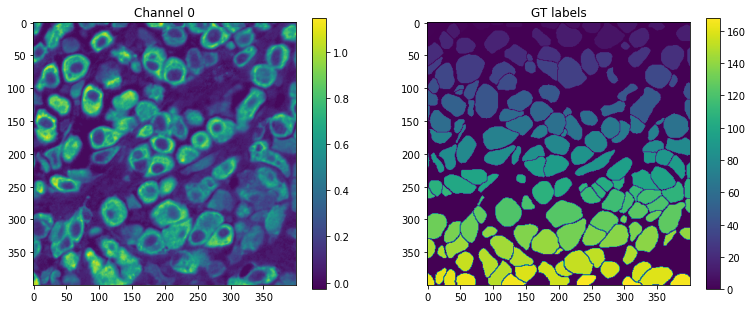

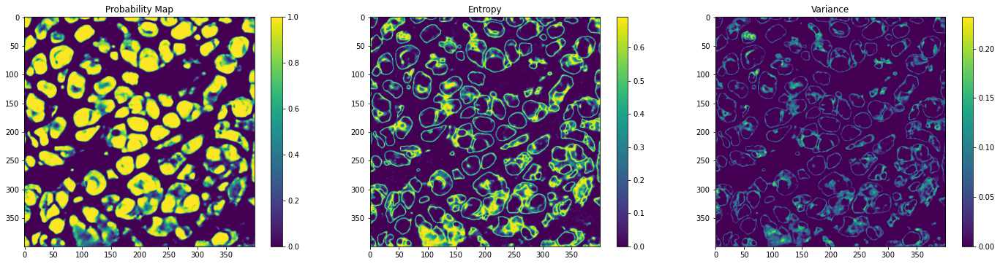

Task :  1  nclasses : 2

Class  0


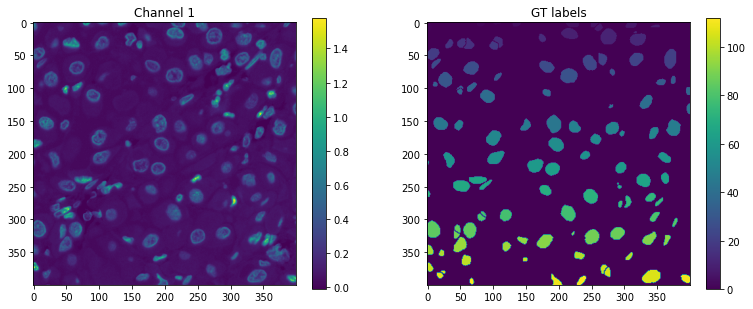

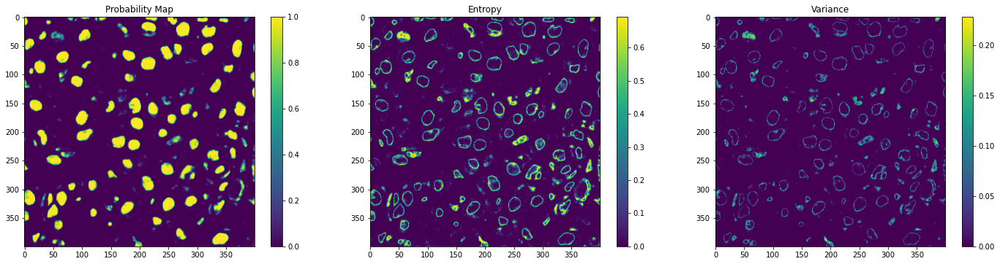

Class  1


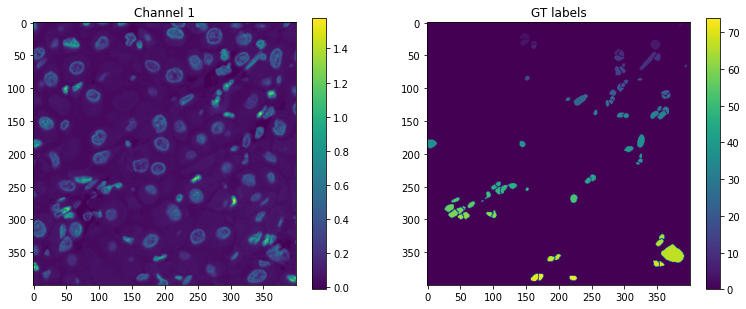

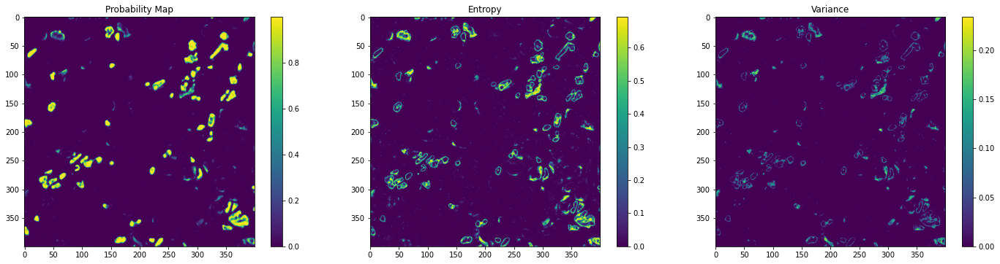

----------------

Image/Group ::  image1.npz / train



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  0  nclasses : 1

Class  0


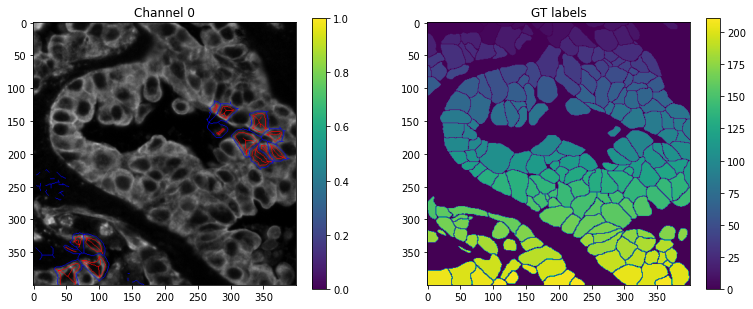

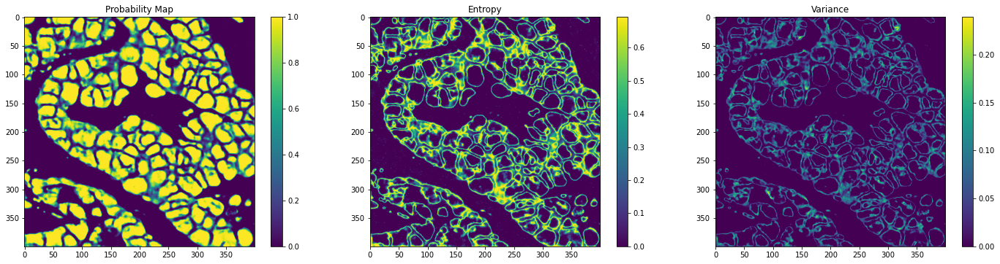

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  1  nclasses : 2

Class  0


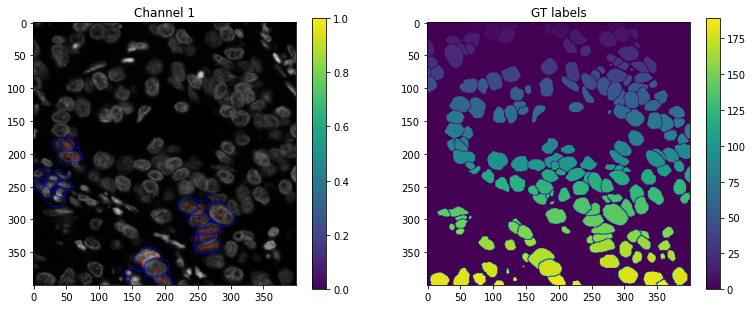

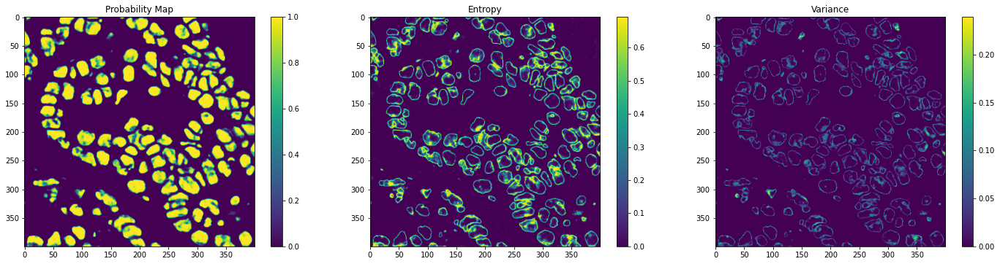

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Class  1


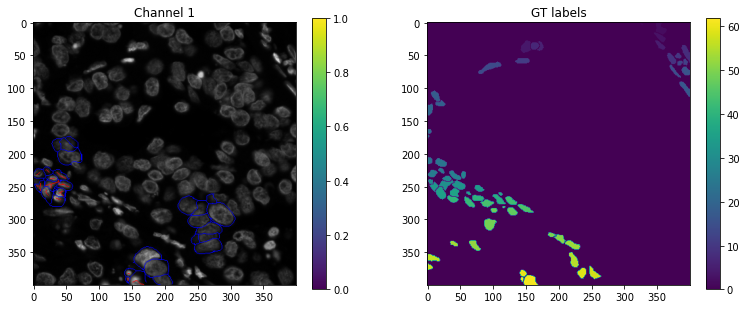

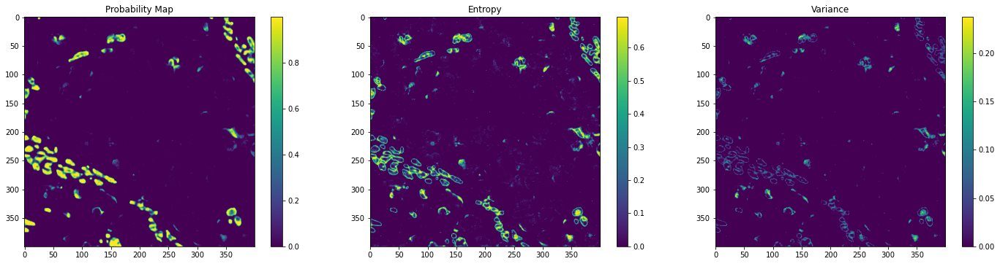

----------------

Image/Group ::  image2.npz / test

Task :  0  nclasses : 1

Class  0


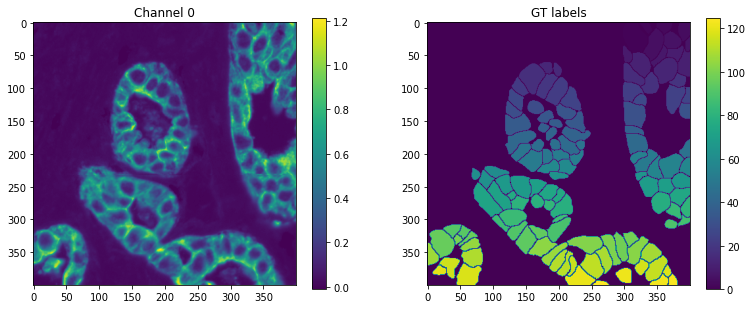

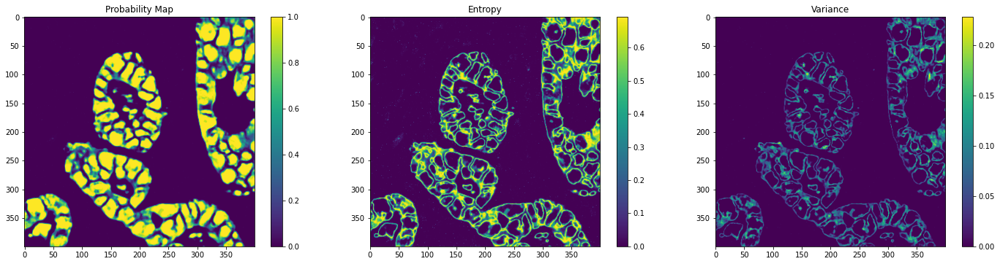

Task :  1  nclasses : 2

Class  0


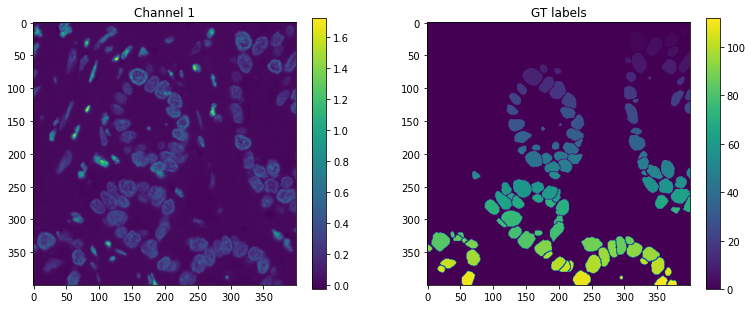

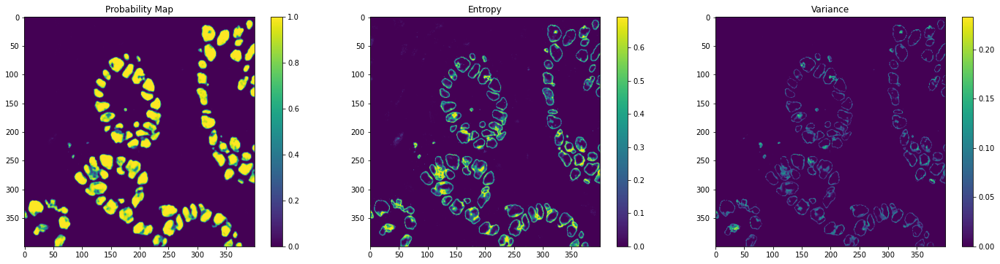

Class  1


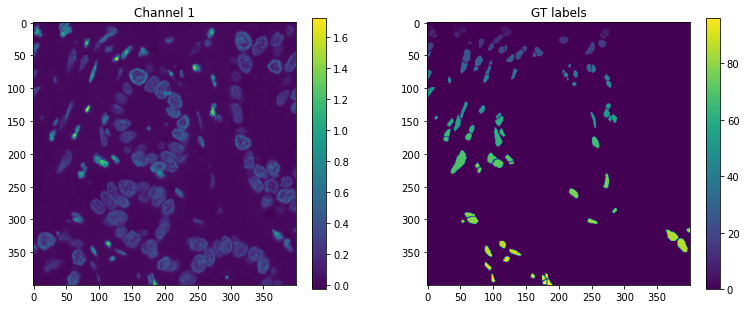

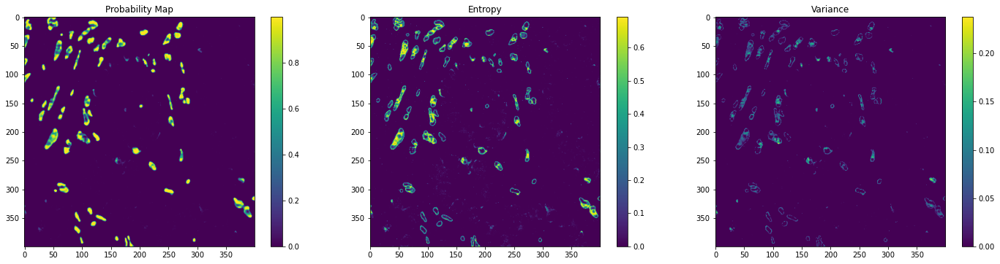

----------------

Image/Group ::  image3.npz / train



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  0  nclasses : 1

Class  0


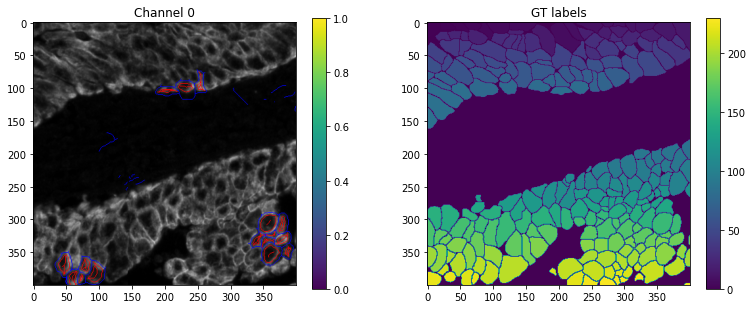

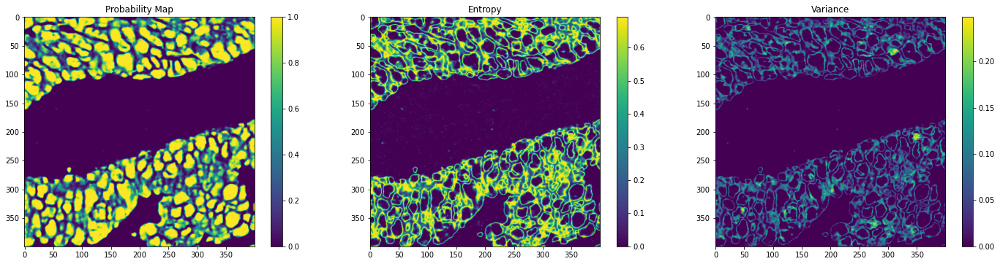

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  1  nclasses : 2

Class  0


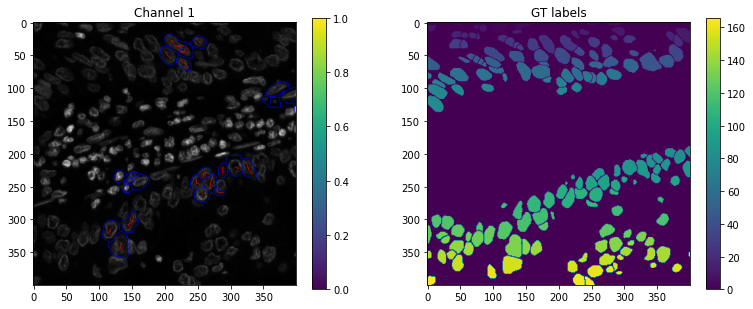

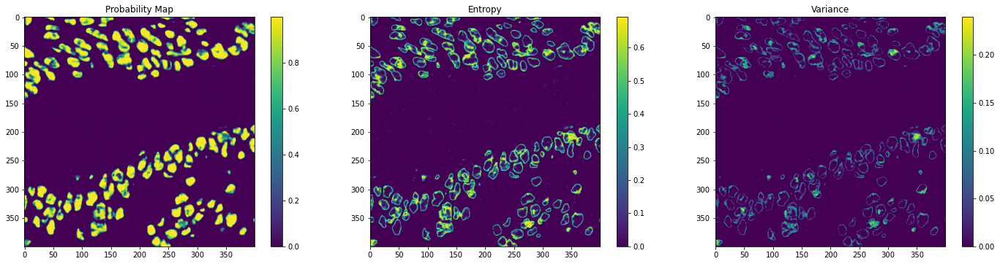

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Class  1


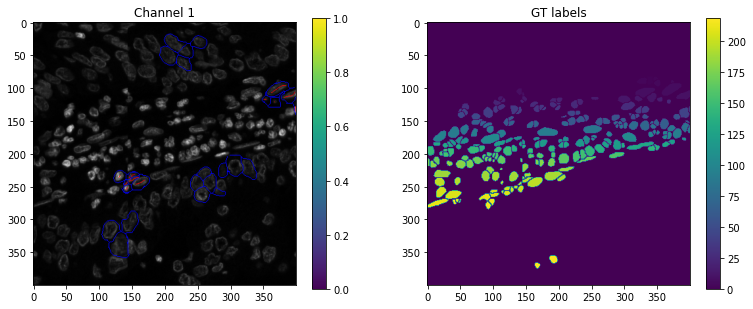

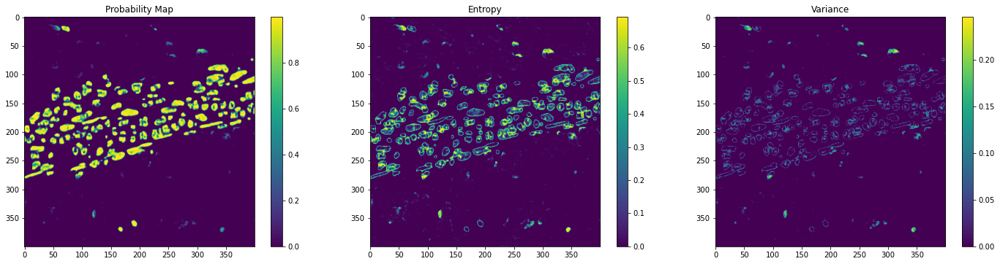

----------------

Image/Group ::  image4.npz / test

Task :  0  nclasses : 1

Class  0


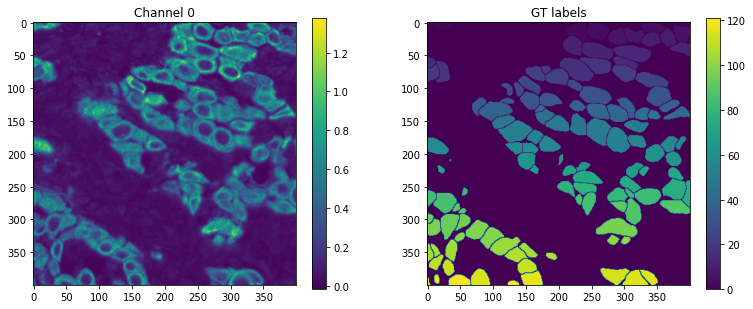

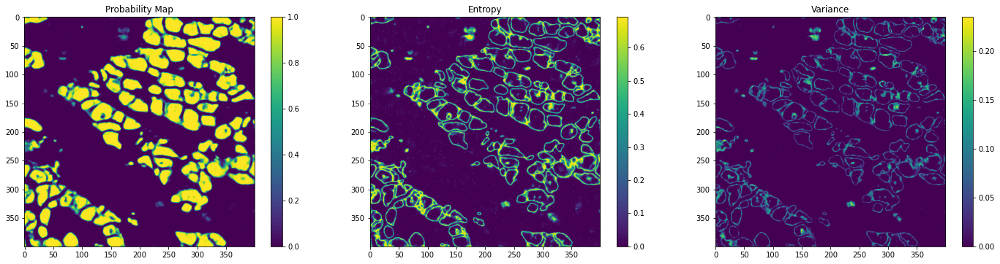

Task :  1  nclasses : 2

Class  0


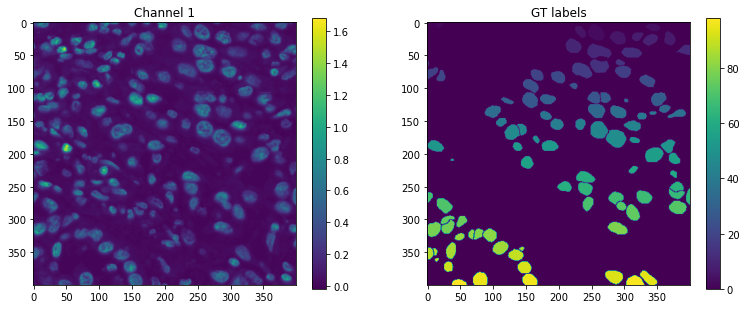

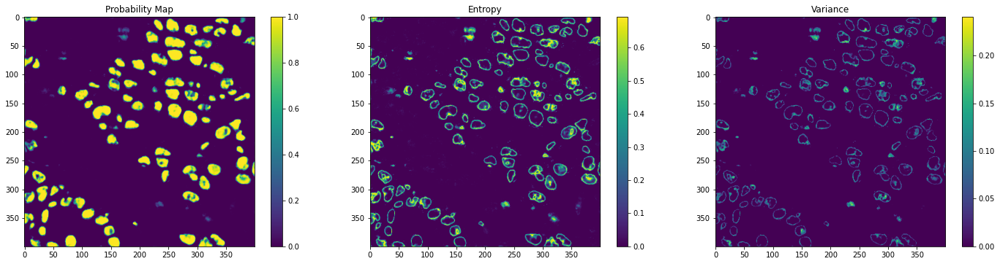

Class  1


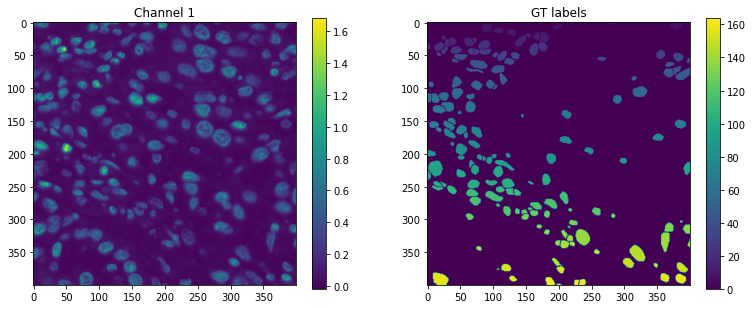

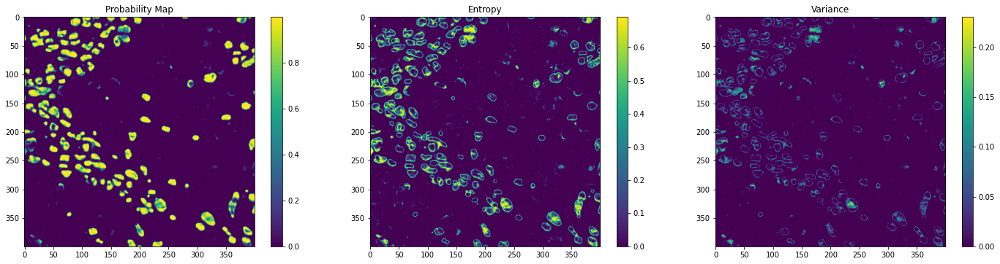

----------------

Image/Group ::  image5.npz / train



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  0  nclasses : 1

Class  0


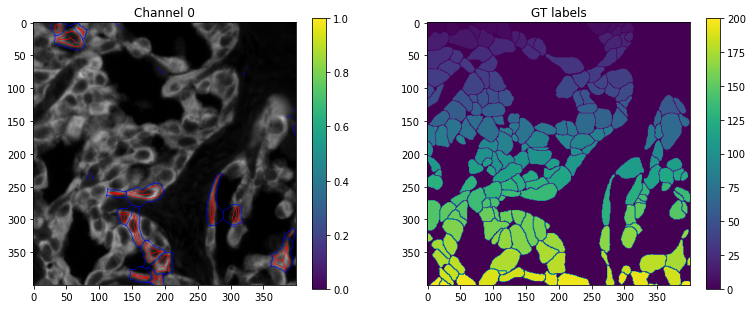

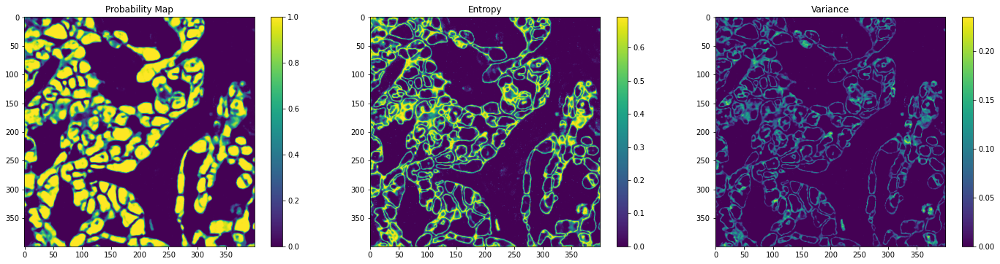

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  1  nclasses : 2

Class  0


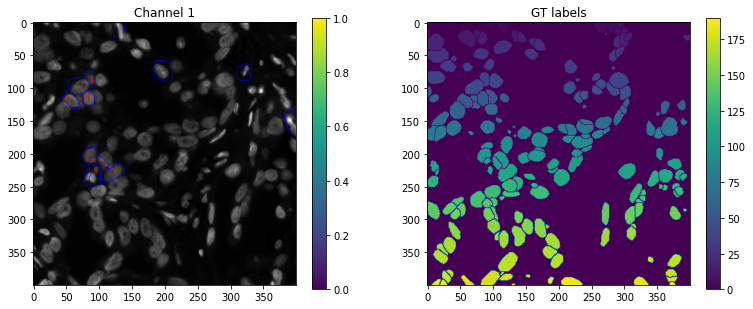

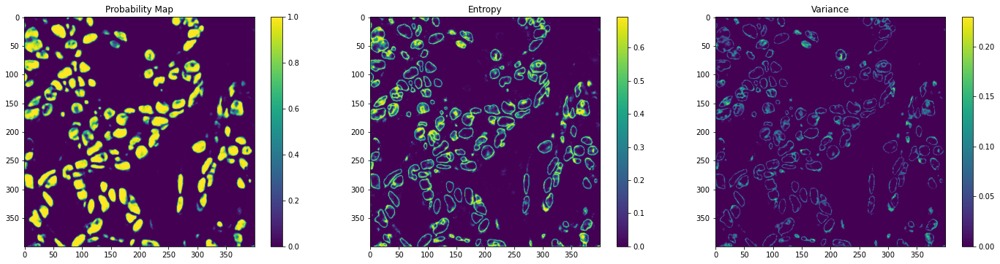

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Class  1


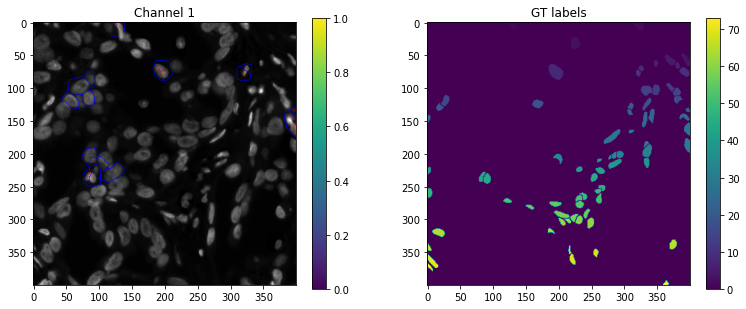

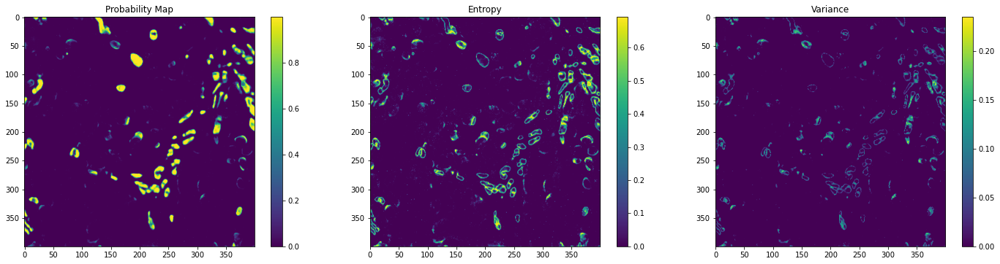

----------------

Image/Group ::  image6.npz / test

Task :  0  nclasses : 1

Class  0


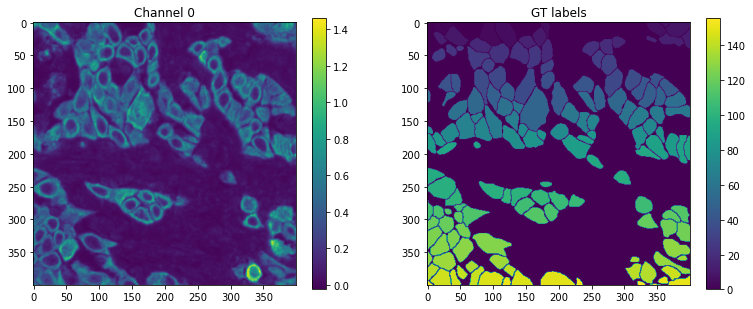

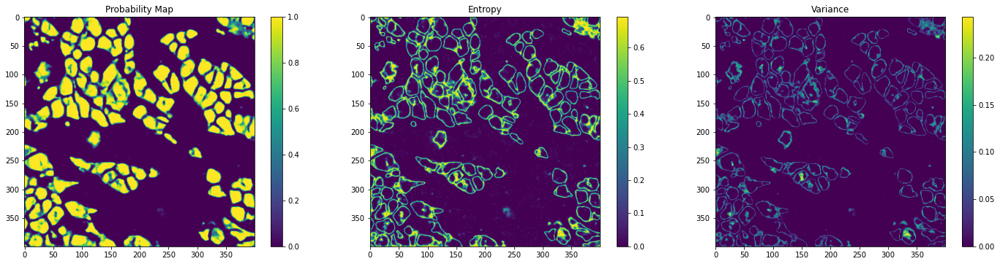

Task :  1  nclasses : 2

Class  0


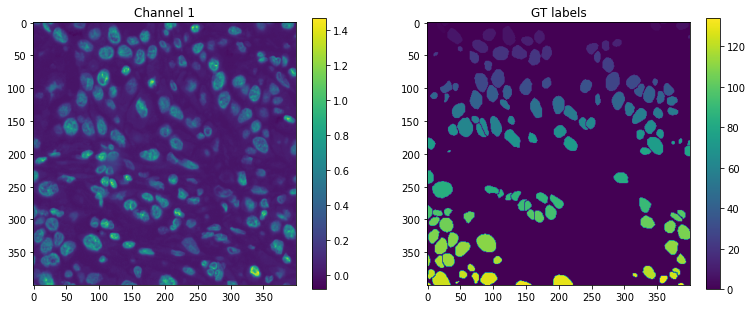

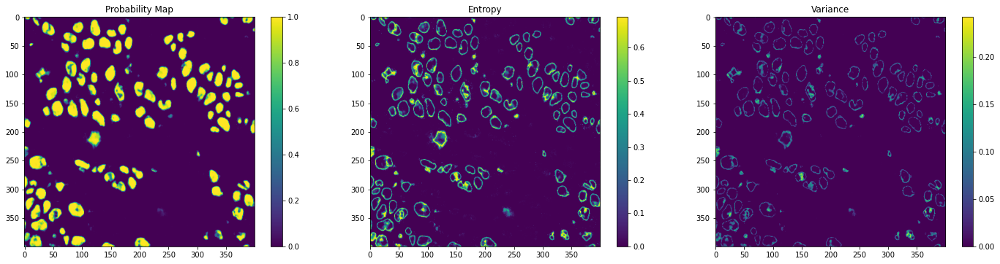

Class  1


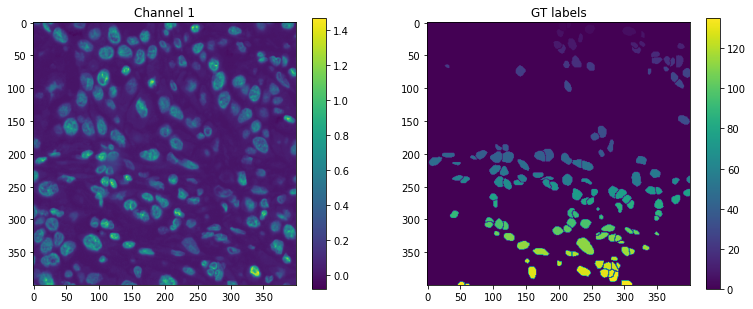

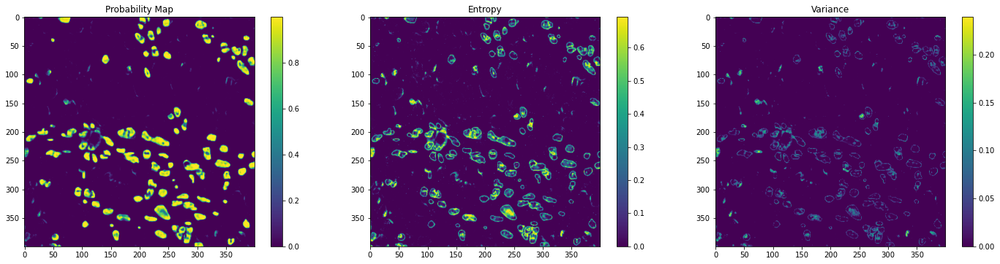

----------------

Image/Group ::  image7.npz / train



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  0  nclasses : 1

Class  0


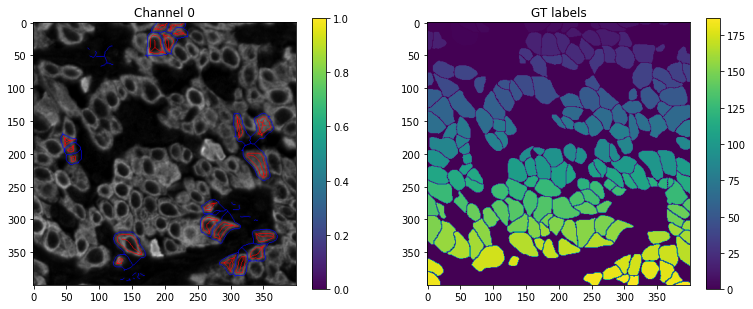

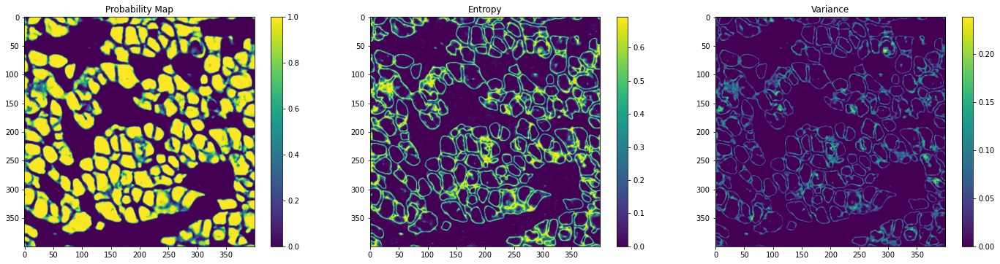

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  1  nclasses : 2

Class  0


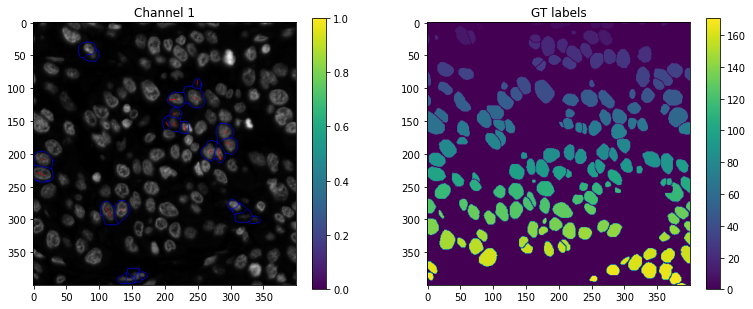

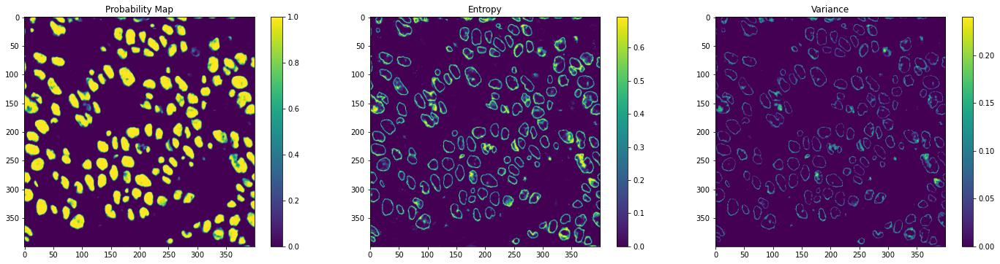

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Class  1


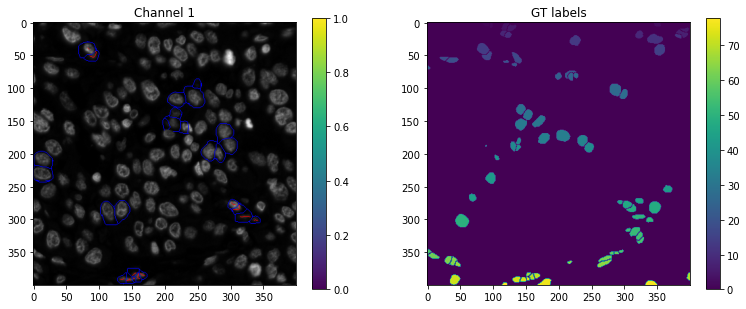

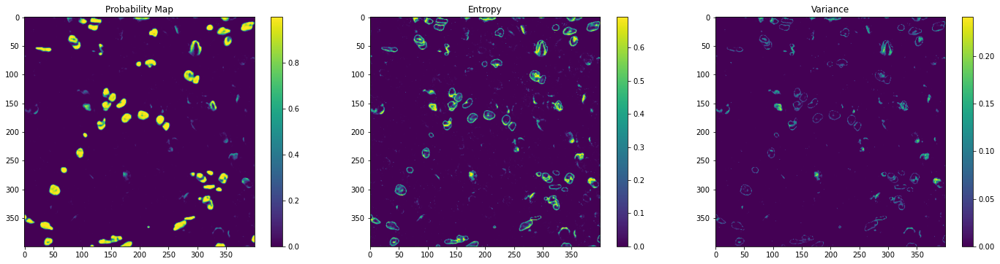

----------------

Image/Group ::  image8.npz / test

Task :  0  nclasses : 1

Class  0


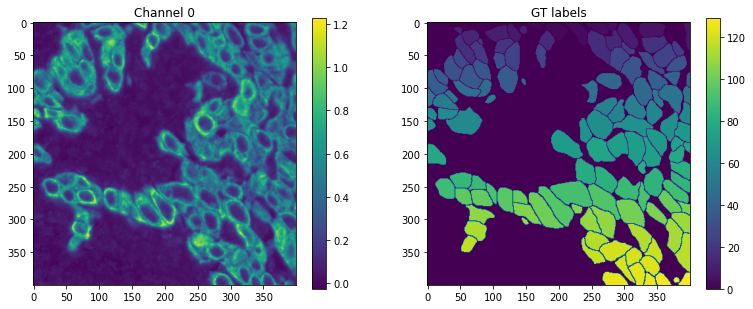

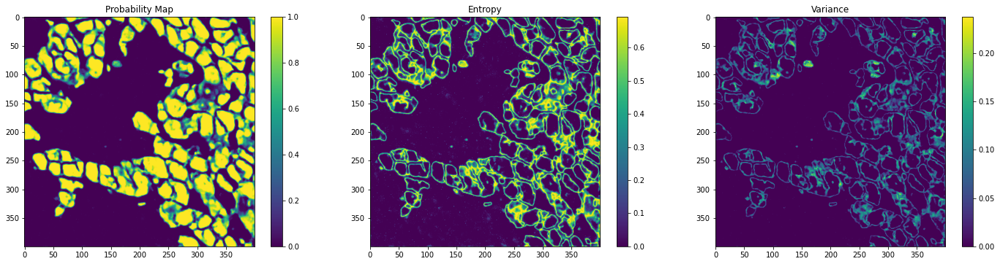

Task :  1  nclasses : 2

Class  0


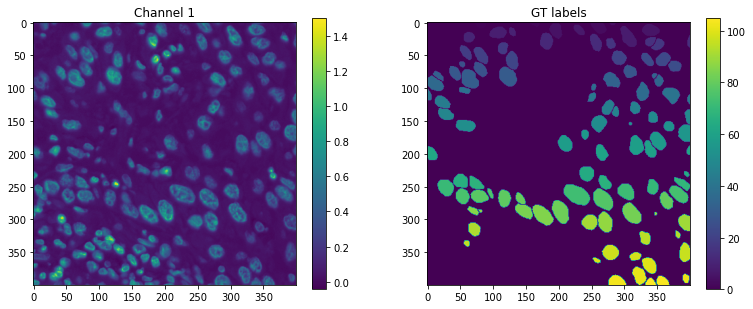

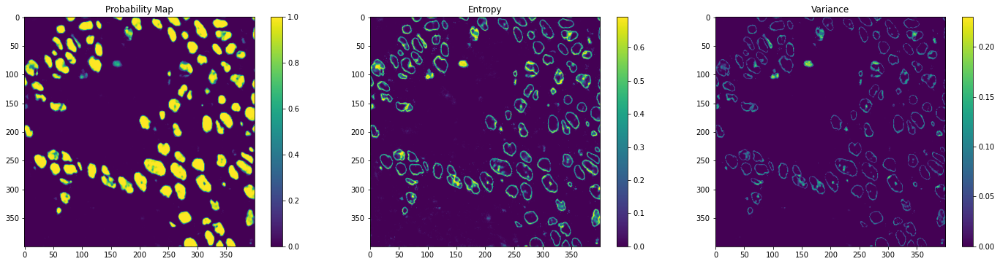

Class  1


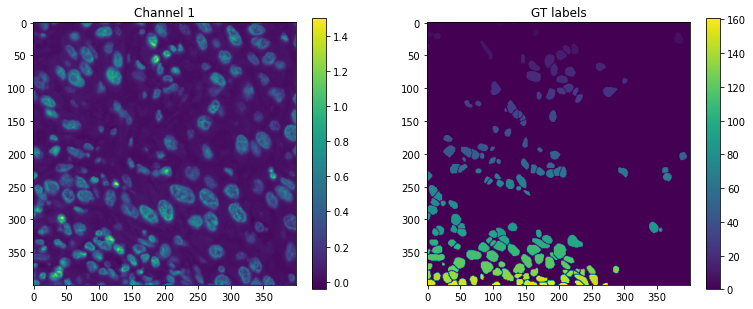

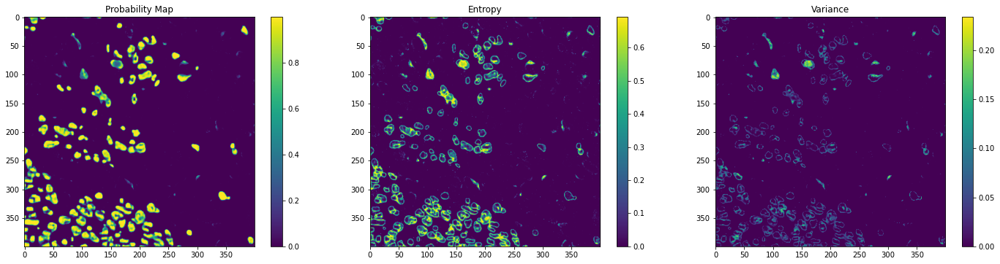

----------------

Image/Group ::  image9.npz / train



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  0  nclasses : 1

Class  0


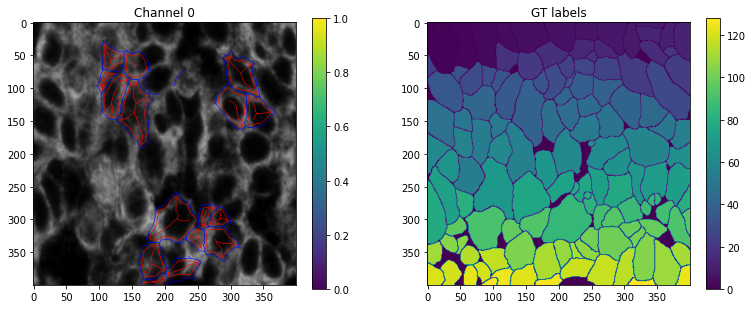

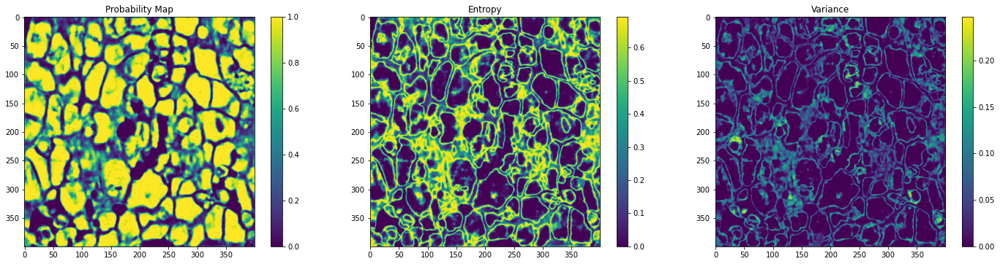

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Task :  1  nclasses : 2

Class  0


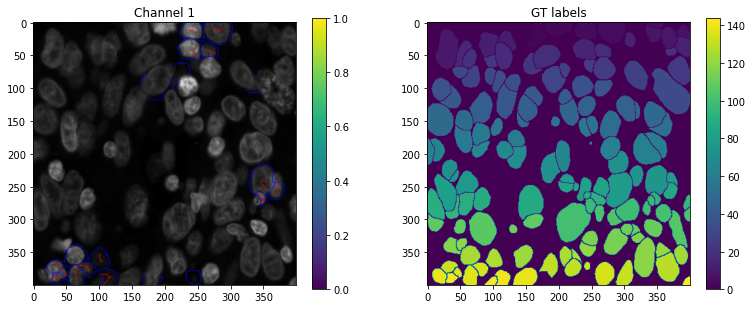

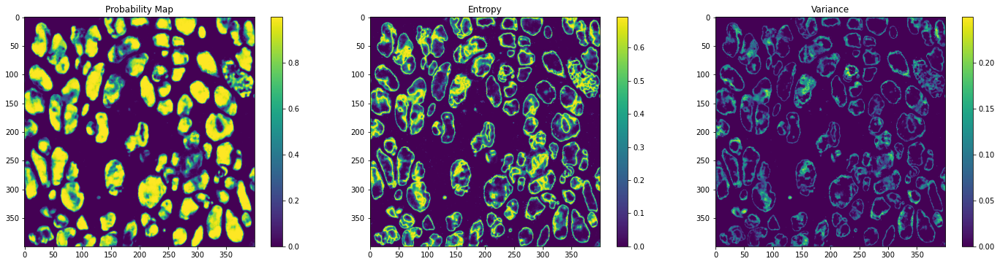

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Class  1


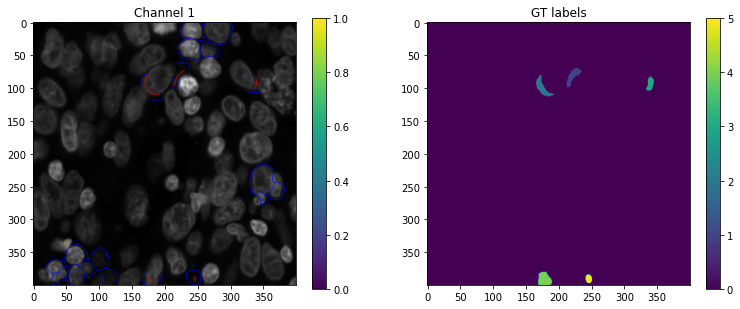

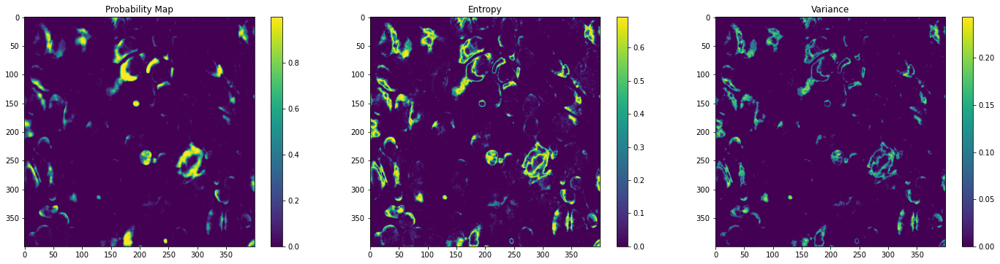

----------------


In [20]:
from general.utils import load_json
config_json = load_json(basedir + model_name + '/config.json')
pd_output_saves = pd.read_csv(basedir+model_name + '/output_images/pd_output_saves.csv')

count = 0
for ix_file in range(len(pd_files)):
    print()

    # count = count + 1
    # if (count != 3):
    #     continue

    print('Image/Group :: ', pd_files['input_file'][ix_file], '/', pd_files['group'][ix_file] )
    print()
    npz_read = np.load(data_dir + pd_files['input_file'][ix_file])
    image = npz_read['image']
    label = npz_read['label']
    
    prefix = pd_files['prefix'][ix_file]
    output_file = pd_output_saves.loc[(pd_output_saves.prefix == prefix)]['output_file'].values[0]
    
    with open(basedir+model_name+'/output_images/' + output_file, 'rb') as file_name:
        #output is a dictionary with tasks as keys (in this case 0 and 1)
        #each output[task] is a dictionary with:
        #   'class_segmentation': np.array size batchxnclassesxhxw, 
        #   'class_segmentation_variance': np.array size batchxnclassesxhxw
        output = pickle.load(file_name) 

    if pd_files['group'][ix_file] == 'train':
        pd_scribble = pd_files_scribbles.loc[pd_files_scribbles['prefix'] == pd_files['prefix'][ix_file]]
        npz_read = np.load(data_dir + pd_scribble['scribble_file'].values[0])
        scribble = npz_read['scribble']

    ix_scribbles = 0
    for task in output.keys():
    #for task in range(0,1):
        
        # get list of corresponding gt indexes to plot
        ix_labels_list = config_json['classification_tasks'][task]['ix_gt_labels']
        rec_channels = config_json['classification_tasks'][task]['rec_channels']
        nclasses = output[task]['class_segmentation'].shape[1]
        
        print('Task : ',task, ' nclasses :',nclasses )
        print()
        for ix_class in range(nclasses):
            print('Class ', ix_class)
            ix_labels = int(ix_labels_list[ix_class])
            plt.figure(figsize=(20,5))
            plt.subplot(1,3,1)
            
            if pd_files['group'][ix_file] == 'train':
                aux = np.ones([image.shape[0],image.shape[1],3])*image[...,rec_channels[0]][...,np.newaxis]*0.6
                aux = aux*(1-scribble[...,ix_scribbles+nclasses][...,np.newaxis])
                aux[...,2] += scribble[...,ix_scribbles+nclasses]
    
                aux = aux*(1-scribble[...,ix_scribbles+ix_class])[...,np.newaxis]
                aux[...,0] += scribble[...,ix_scribbles+ix_class]
                
                plt.imshow(aux) #scribbel
            else:
                plt.imshow(image[...,rec_channels[0]]) # original image channel zero
            plt.title('Channel '+ str(rec_channels[0]))
            plt.colorbar()

            plt.subplot(1,3,2)
            plt.title('GT labels')
            plt.imshow(label[...,ix_labels]) #Ground truth
            ix_labels += 1
            plt.colorbar()
#             plt.tight_layout()
            plt.show()

            plt.figure(figsize=(20,5))
            plt.subplot(1,3,1)
            plt.title('Probability Map')
            plt.imshow((output[task]['class_segmentation'][0,ix_class,...]))    #prediction for class 0
            plt.colorbar()
            
            plt.subplot(1,3,2)
            plt.title('Entropy')
            entropy = -output[task]['class_segmentation'][0,ix_class,...]*np.log(np.maximum(output[task]['class_segmentation'][0,ix_class,...],1e-5))
            entropy += -(1-output[task]['class_segmentation'][0,ix_class,...])*np.log(np.maximum(1-output[task]['class_segmentation'][0,ix_class,...],1e-5))
            plt.imshow(entropy) #Entropy
            plt.colorbar()
            
            if 'class_segmentation_variance' in output[task].keys():
                plt.subplot(1,3,3)
                plt.title('Variance')
                plt.imshow((output[task]['class_segmentation_variance'][0,ix_class,...])) #Variance
                plt.colorbar()
                
            
            plt.tight_layout()
            plt.show()
        
        ix_scribbles += nclasses + 1
    # break
    print('----------------')